### Setup

In [1]:
# Import packages
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os
import pandas as pd

In [2]:
# Set where images of candidates are
image_folder = '/home/noah/Desktop/BL/candidate_plots'
antenna_image_paths = glob.glob(os.path.join(image_folder, "*_antennas.png"))
coherent_image_paths = ["_".join(path.split('_')[:-1]) + "_coherent.png" for path in antenna_image_paths]
incoherent_image_paths = ["_".join(path.split('_')[:-1]) + "_incoherent.png" for path in antenna_image_paths]

### Setting the promising candidates

In [3]:
# Indices found by hand in the script
promising_candidate_indices = [147, 197, 222, 241, 288, 326, 350, 382, 386, 442, 451, 457]
# Note:
# index 1 in this list was the one after the promising signal (promising signal is indices[1] - 1)
# index 6 in this list was the one after the promising signal (promising signal is indices[6] - 1)

# Adjust those notes
promising_indices = promising_candidate_indices.copy()
promising_indices[1] -= 1
promising_indices[6] -= 1

# Double check
print(promising_candidate_indices)
print(promising_indices)

[147, 197, 222, 241, 288, 326, 350, 382, 386, 442, 451, 457]
[147, 196, 222, 241, 288, 326, 349, 382, 386, 442, 451, 457]


In [15]:
os.path.basename(coherent_image_paths[promising_indices[0]])
coherent_image_paths[promising_indices[0]]

'/home/noah/Desktop/BL/candidate_plots/stamp_23B-169.sb44907755.eb44921564.60295.44951556713.34.1.AC.C416.0021.raw.seticore.0000_22_coherent.png'

In [16]:
# Save copies of the pngs of the promising candidates into their own folder
for index in promising_indices:
    for src in [antenna_image_paths[index], coherent_image_paths[index], incoherent_image_paths[index]]:
        dst = os.path.join("/home/noah/Desktop/BL/promising_candidate_plots", os.path.basename(src))
        os.system(f'cp {src} {dst}')

In [6]:
# Match the filenames of the images from the promising stamps to indices within candidates_indexed.csv
promising_index_in_candidates = []
promising_png_filenames = np.array(["_".join(f.split("/")[-1].split("_")[1:-1]) for f in np.array(antenna_image_paths)[promising_indices]])

# Load in the data from candidates
candidates = pd.read_csv("candidates_indexed.csv")
stamp_filenames = np.array(['.'.join(row.stamp_uri.split('/')[-1].split('.')[:-1]) + f"_{row.stamp_index}" for _, row in candidates.iterrows()])

# Find the index in the candidates dataframe for each promising stamp 
for png_filename in promising_png_filenames:
    promising_index_in_candidates.append(np.where(stamp_filenames == png_filename)[0][0])

print(promising_indices)
print(promising_index_in_candidates)

[147, 196, 222, 241, 288, 326, 349, 382, 386, 442, 451, 457]
[448, 323, 51, 53, 54, 218, 52, 325, 220, 453, 451, 450]


In [60]:
def show_image_at_index(paths, index):
    image = mpimg.imread(paths[index])
    plt.imshow(image)
    plt.show()

### Looking at antennas

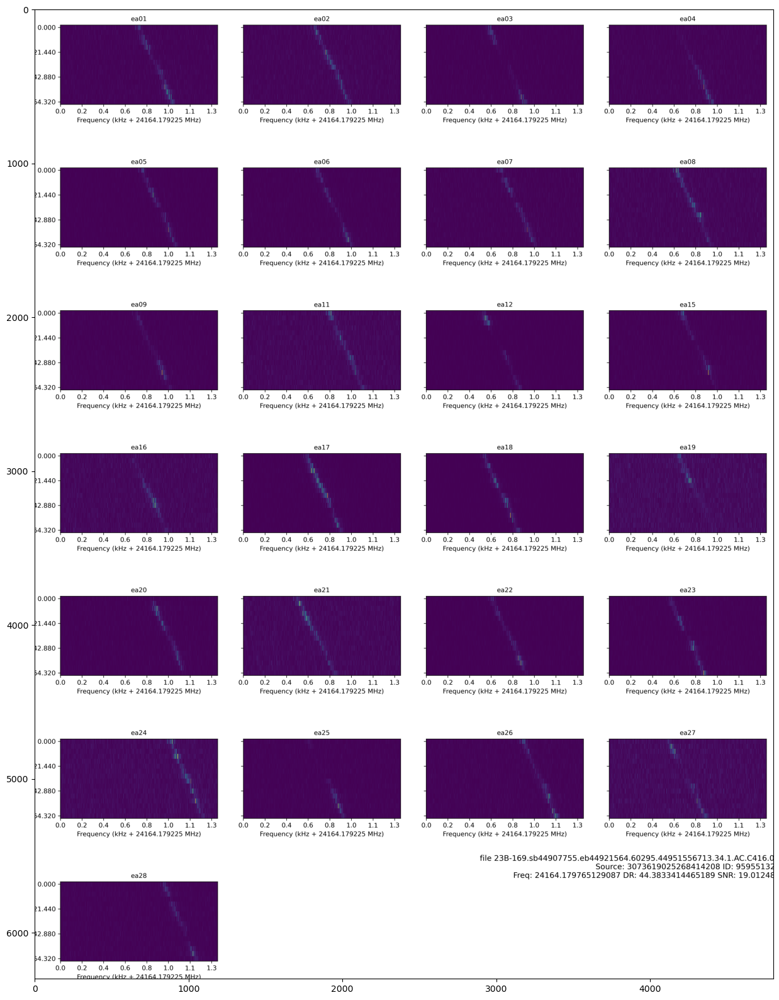

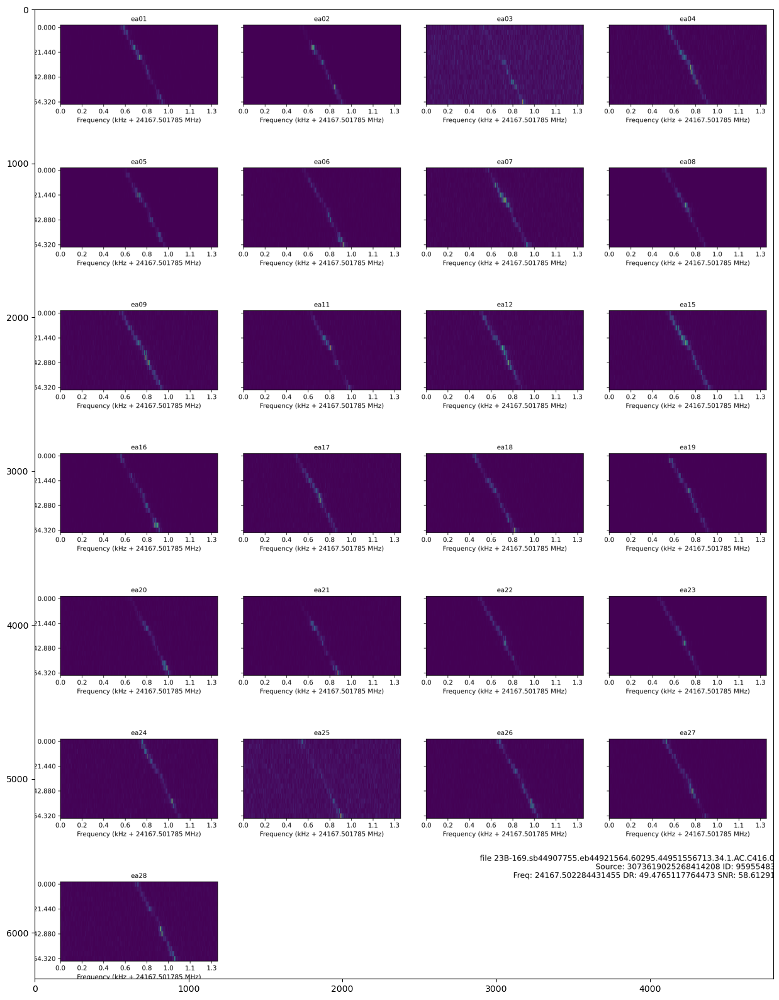

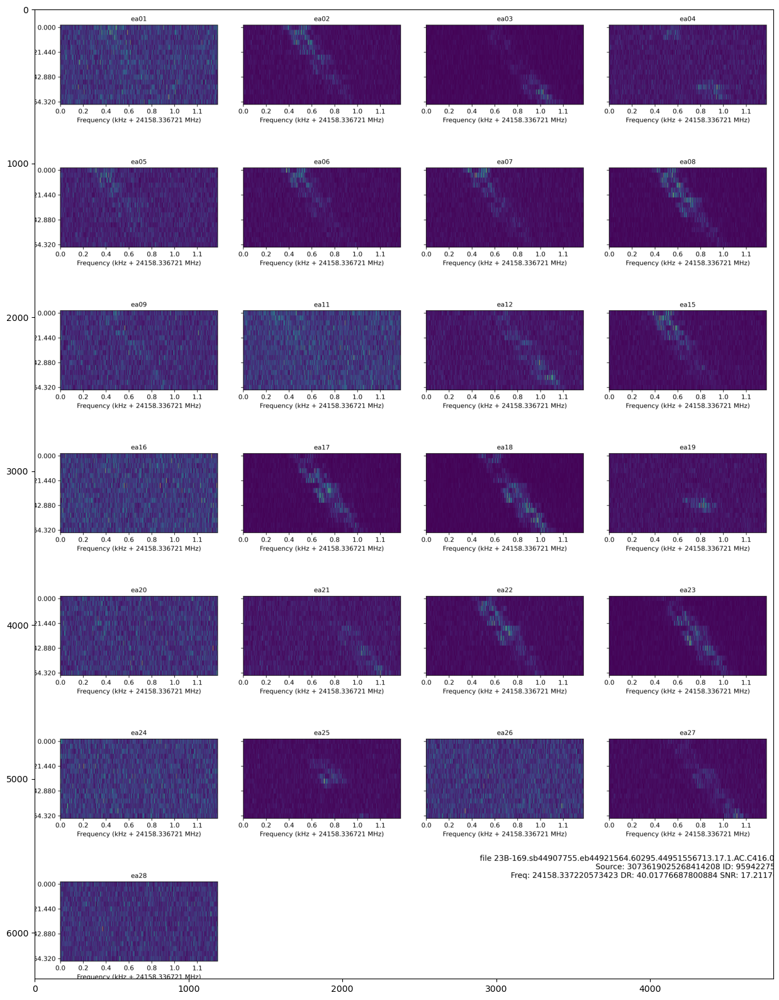

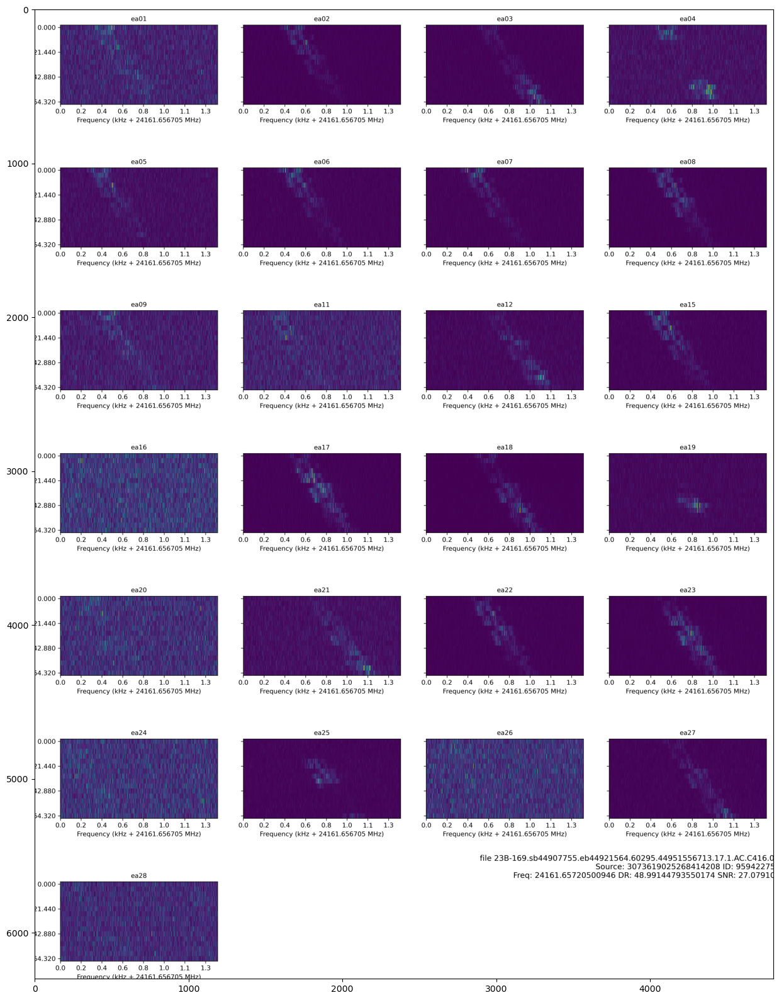

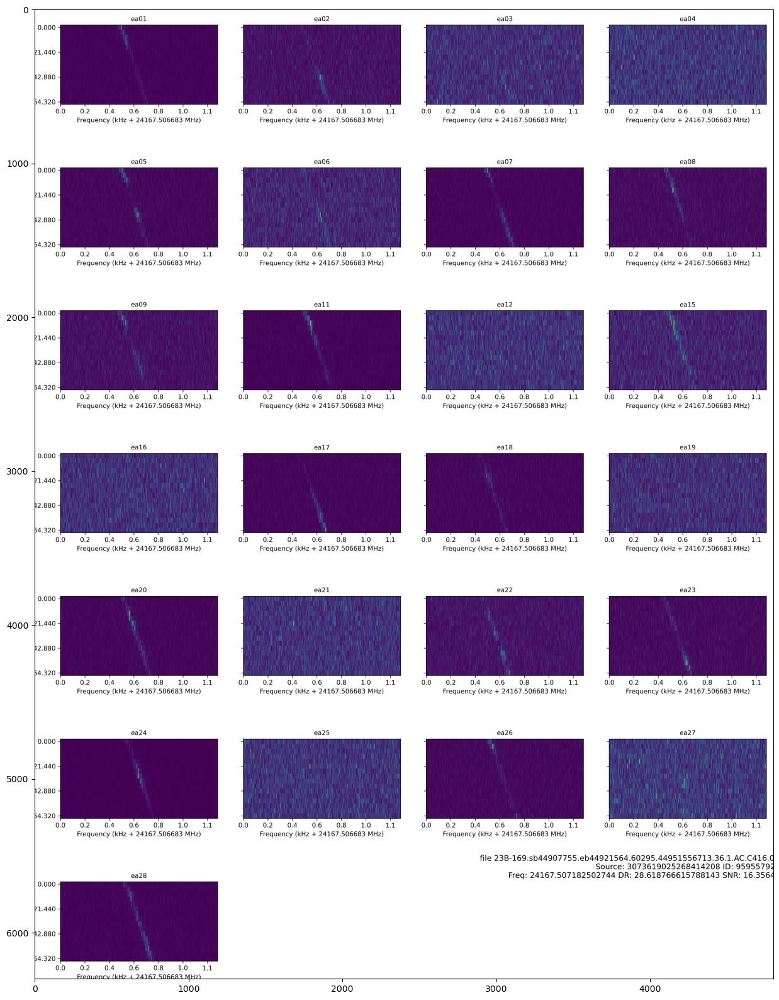

...

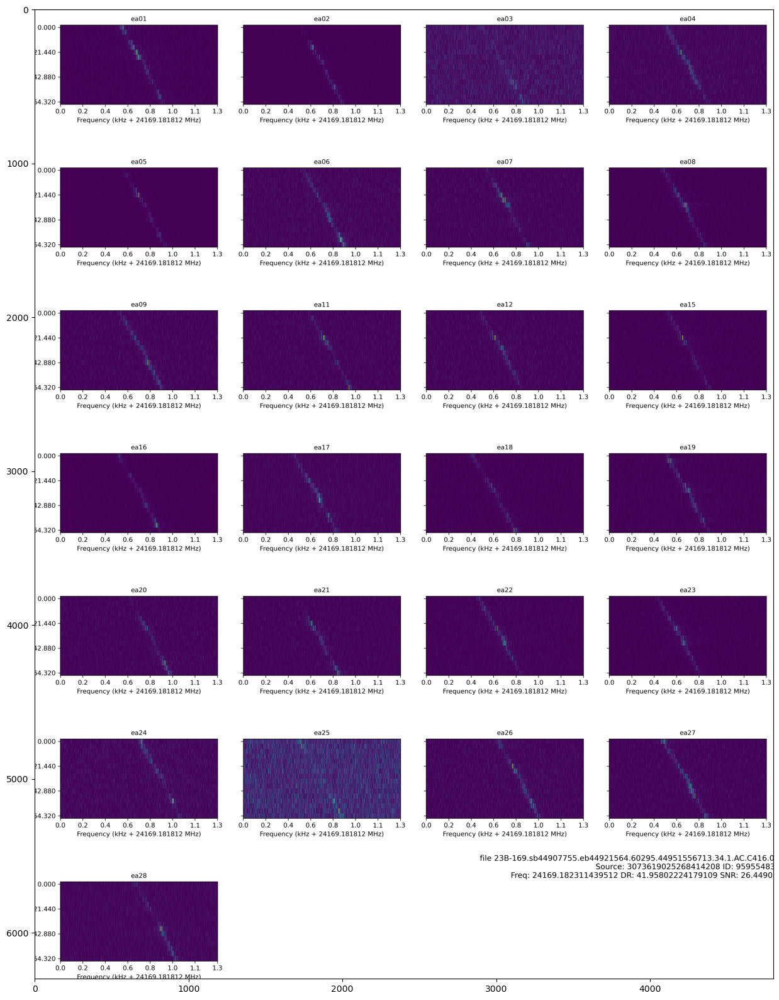

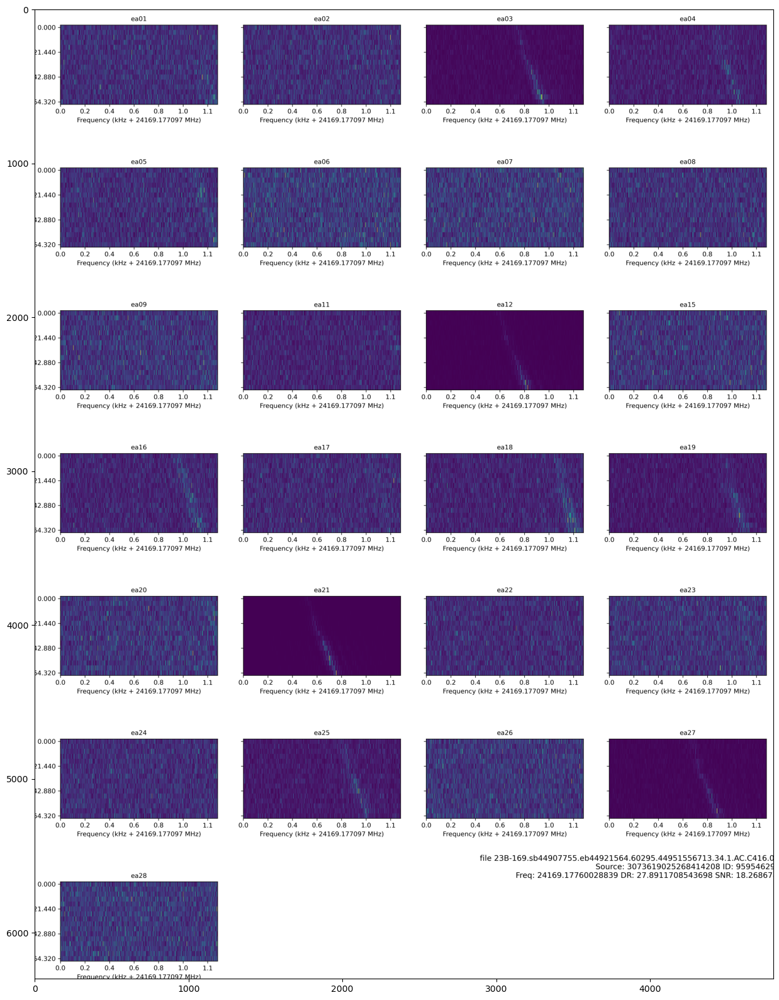

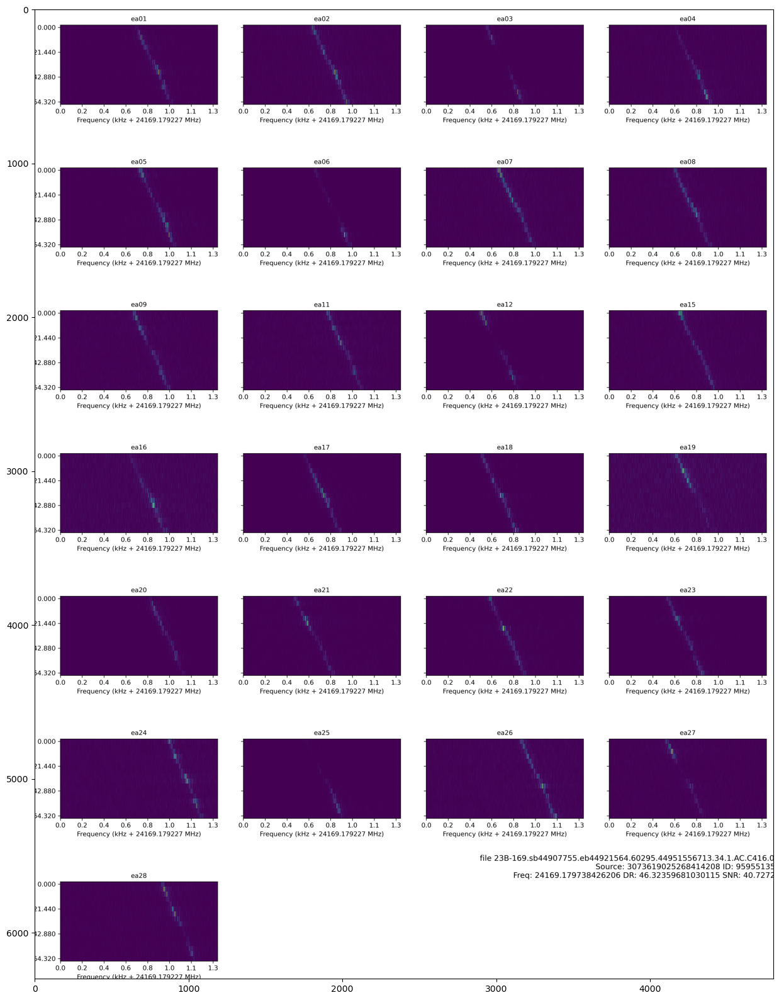

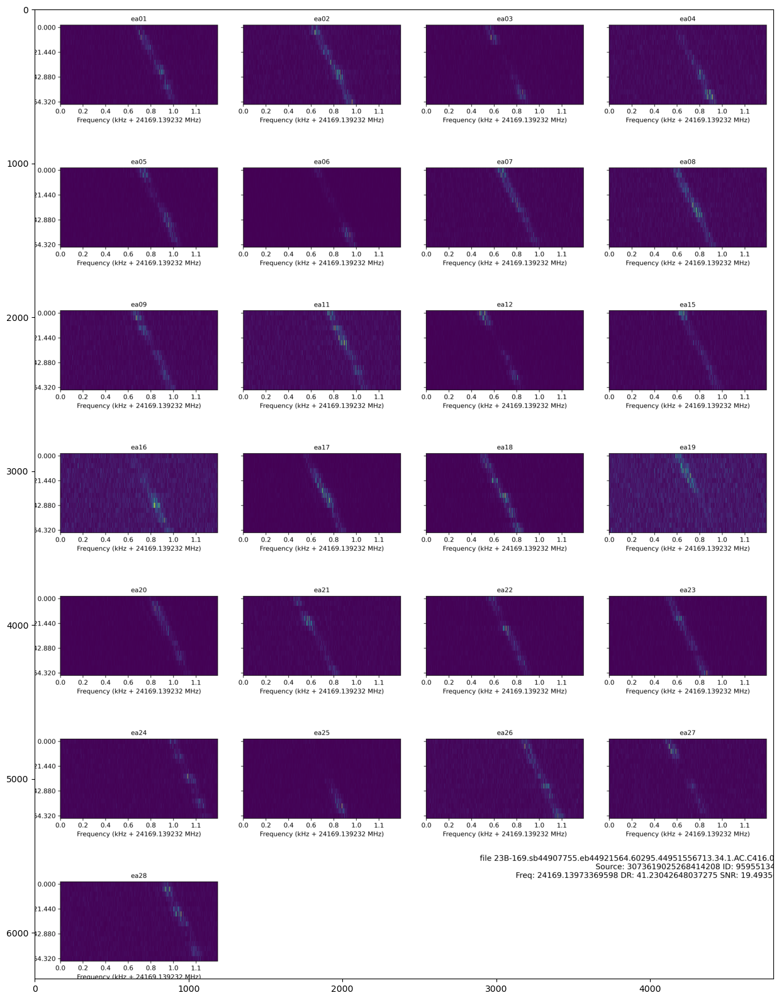

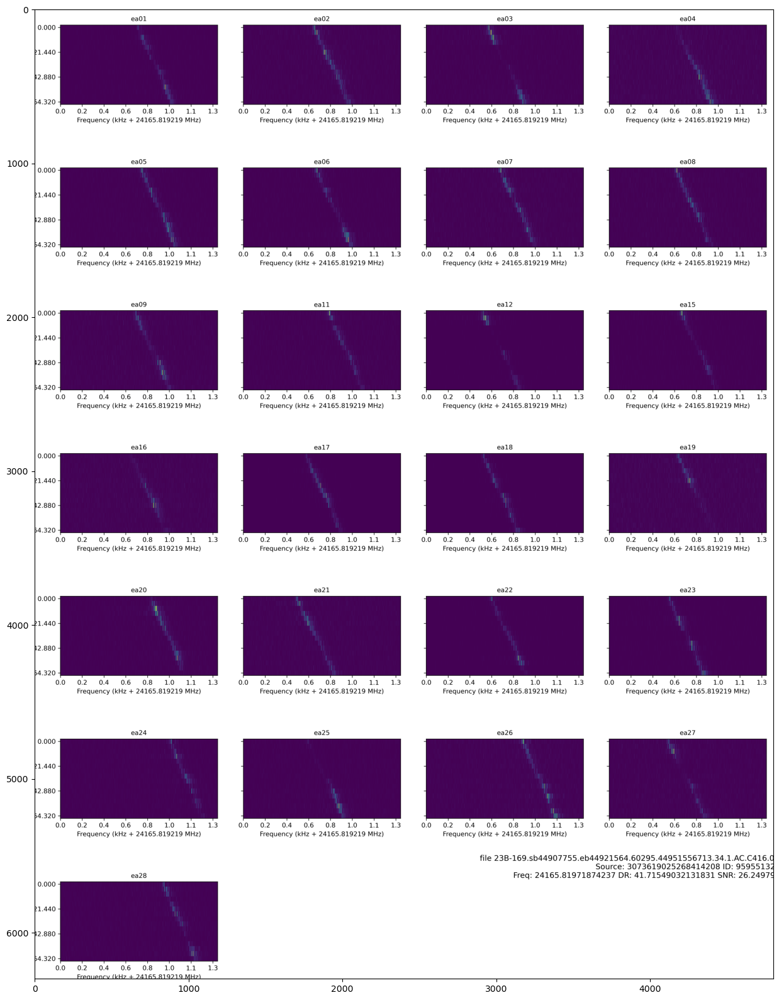

In [62]:
# Look at all the images
for index in promising_indices:
    fig = plt.figure(figsize=(30, 20))
    show_image_at_index(antenna_image_paths, index)

### Looking at coherent

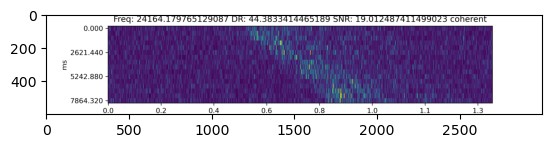

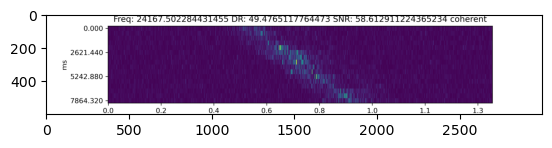

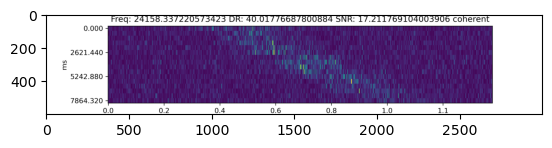

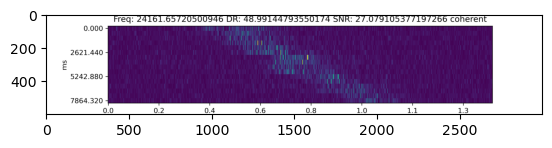

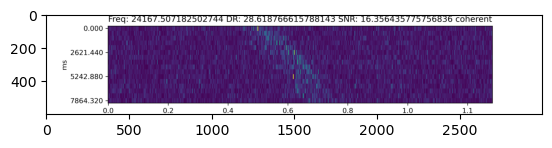

...

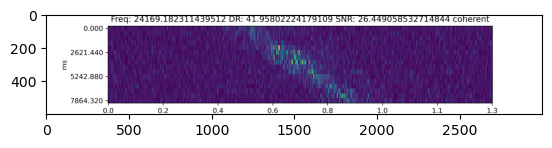

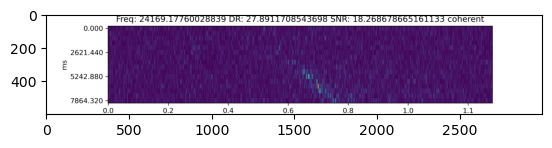

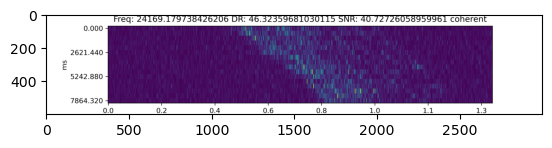

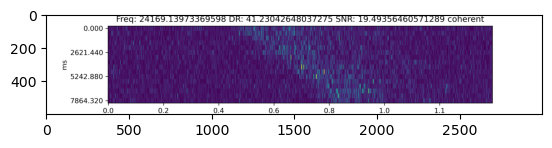

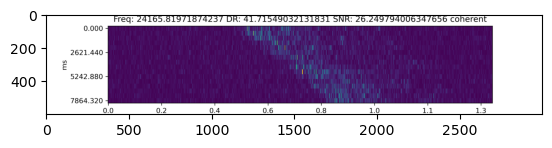

In [63]:
# Look at all the images
for index in promising_indices:
    show_image_at_index(coherent_image_paths, index)

### Looking at incoherent

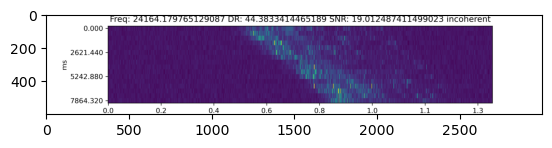

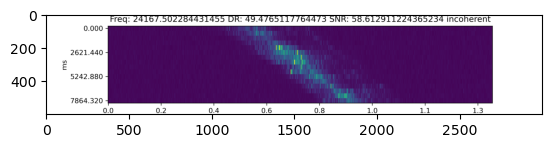

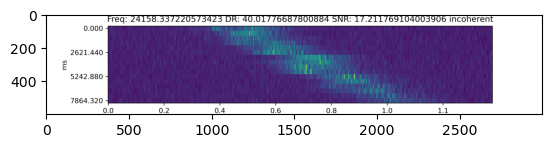

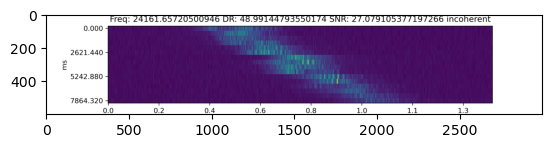

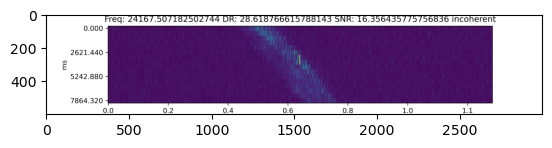

...

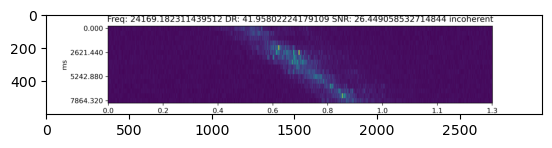

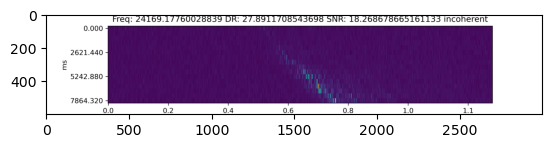

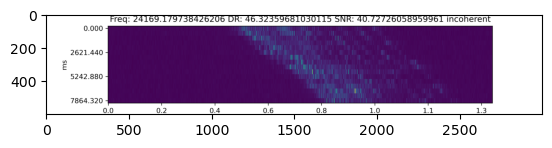

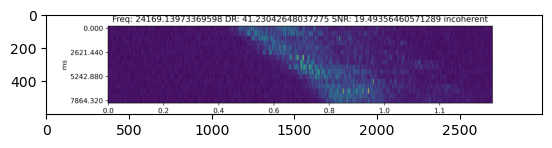

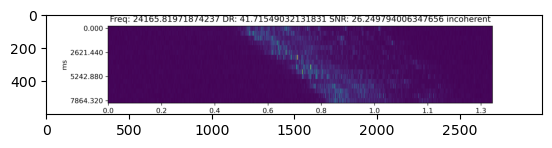

In [64]:
# Look at all the images
for index in promising_indices:
    show_image_at_index(incoherent_image_paths, index)